<>:127: SyntaxWarning: invalid escape sequence '\_'
<>:192: SyntaxWarning: invalid escape sequence '\_'
<>:243: SyntaxWarning: invalid escape sequence '\ '
<>:127: SyntaxWarning: invalid escape sequence '\_'
<>:192: SyntaxWarning: invalid escape sequence '\_'
<>:243: SyntaxWarning: invalid escape sequence '\ '
C:\Users\amree\AppData\Local\Temp\ipykernel_27092\3220607772.py:127: SyntaxWarning: invalid escape sequence '\_'
  """the function calls Faster R-CNN <code> model\_ </code> but save RAM:
C:\Users\amree\AppData\Local\Temp\ipykernel_27092\3220607772.py:192: SyntaxWarning: invalid escape sequence '\_'
  """<p><b>note</b>:  if you call <code>model\_(\[img])</code>  directly but it will use more RAM</p>
C:\Users\amree\AppData\Local\Temp\ipykernel_27092\3220607772.py:243: SyntaxWarning: invalid escape sequence '\ '
  """We can localize objects; we do this using the function <code>get_predictions</code>. The input  is the predictions <code>pred</code> and the <code>objects</code> you wo

done


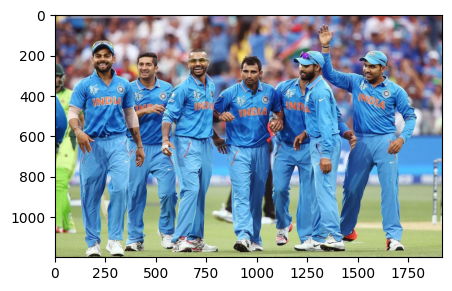

1300 133 1795 1151


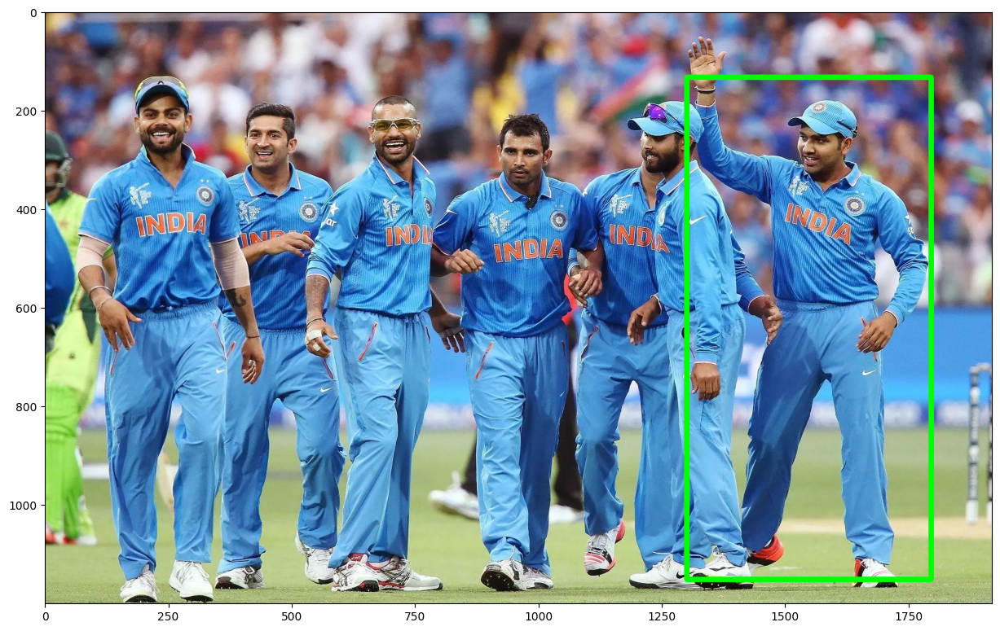


Label: person
Box coordinates: 1300, 133, 1795, 1151
Probability: 0.9991276860237122

Label: person
Box coordinates: 782, 199, 1122, 1148
Probability: 0.9990205764770508

Label: person
Box coordinates: 48, 128, 452, 1192
Probability: 0.9984908103942871

Label: person
Box coordinates: 522, 165, 856, 1182
Probability: 0.9964203834533691

Label: person
Box coordinates: 351, 171, 599, 1162
Probability: 0.9950094223022461

Label: person
Box coordinates: 1078, 120, 1411, 1188
Probability: 0.9923851490020752

Label: person
Box coordinates: 1195, 203, 1472, 1163
Probability: 0.9726346135139465

Label: person
Box coordinates: 0, 279, 134, 1103
Probability: 0.9688748121261597


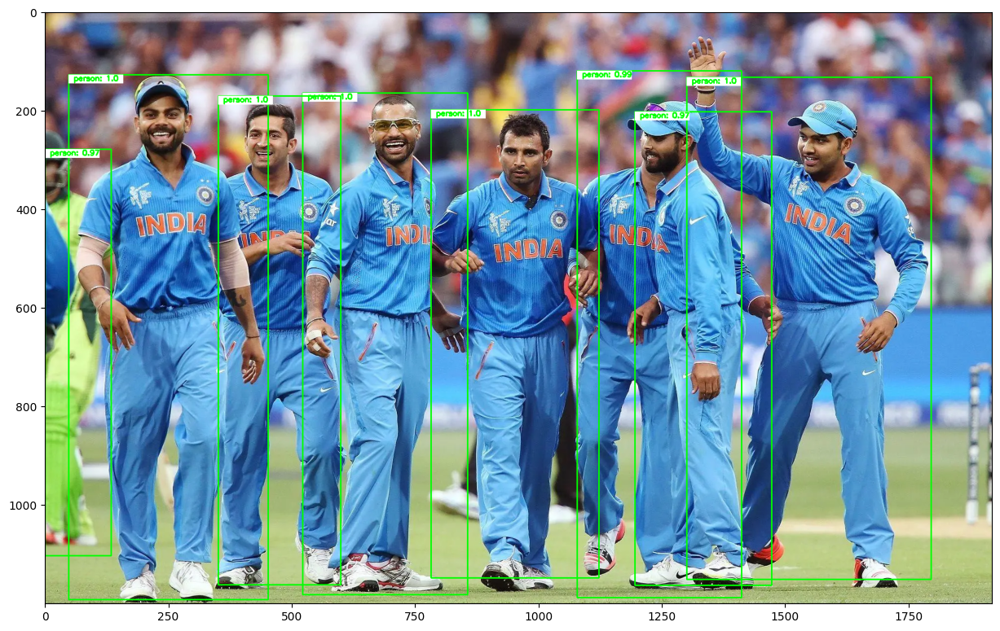


Label: person
Box coordinates: 1300, 133, 1795, 1151
Probability: 0.9991276860237122

Label: person
Box coordinates: 782, 199, 1122, 1148
Probability: 0.9990205764770508

Label: person
Box coordinates: 48, 128, 452, 1192
Probability: 0.9984908103942871

Label: person
Box coordinates: 522, 165, 856, 1182
Probability: 0.9964203834533691

Label: person
Box coordinates: 351, 171, 599, 1162
Probability: 0.9950094223022461

Label: person
Box coordinates: 1078, 120, 1411, 1188
Probability: 0.9923851490020752


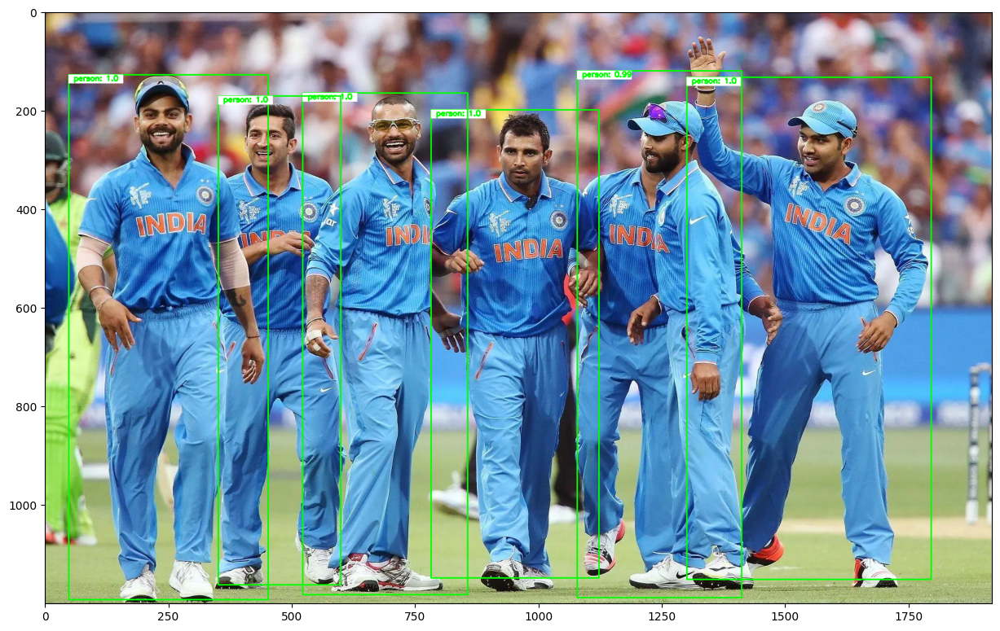

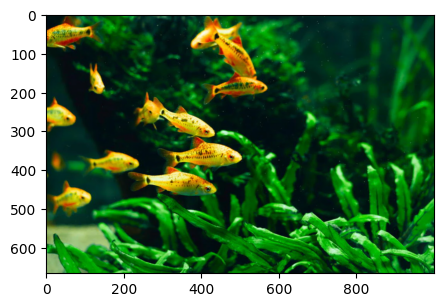


Label: bird
Box coordinates: 78, 353, 239, 417
Probability: 0.9079908728599548

Label: bird
Box coordinates: 3, 12, 137, 109
Probability: 0.8701769113540649

Label: banana
Box coordinates: 208, 394, 440, 471
Probability: 0.8610079288482666

Label: bird
Box coordinates: 241, 210, 435, 322
Probability: 0.8269436359405518


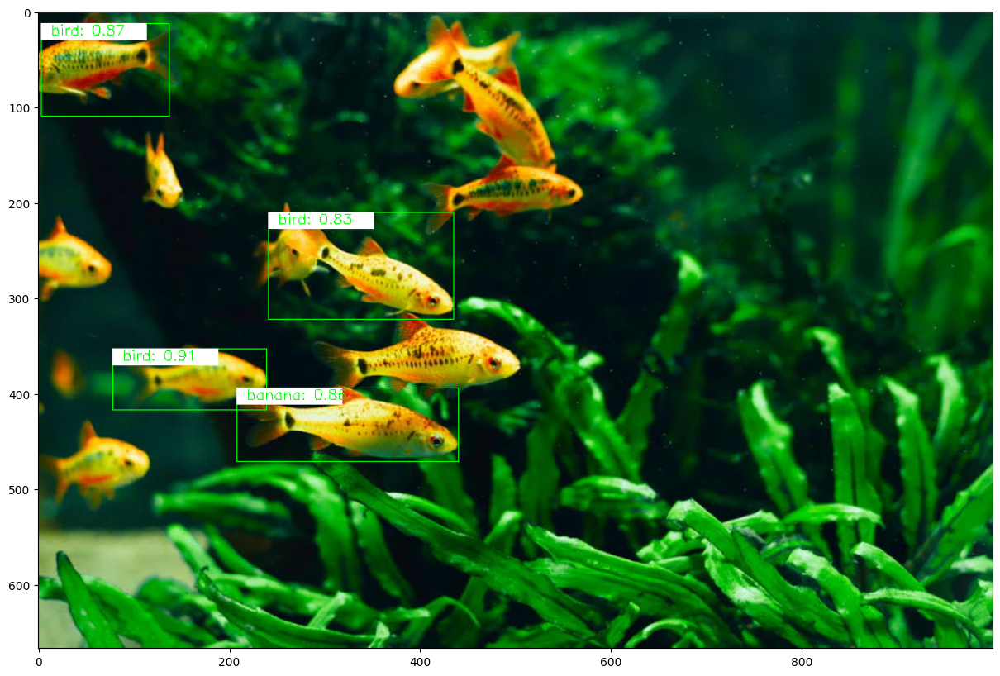

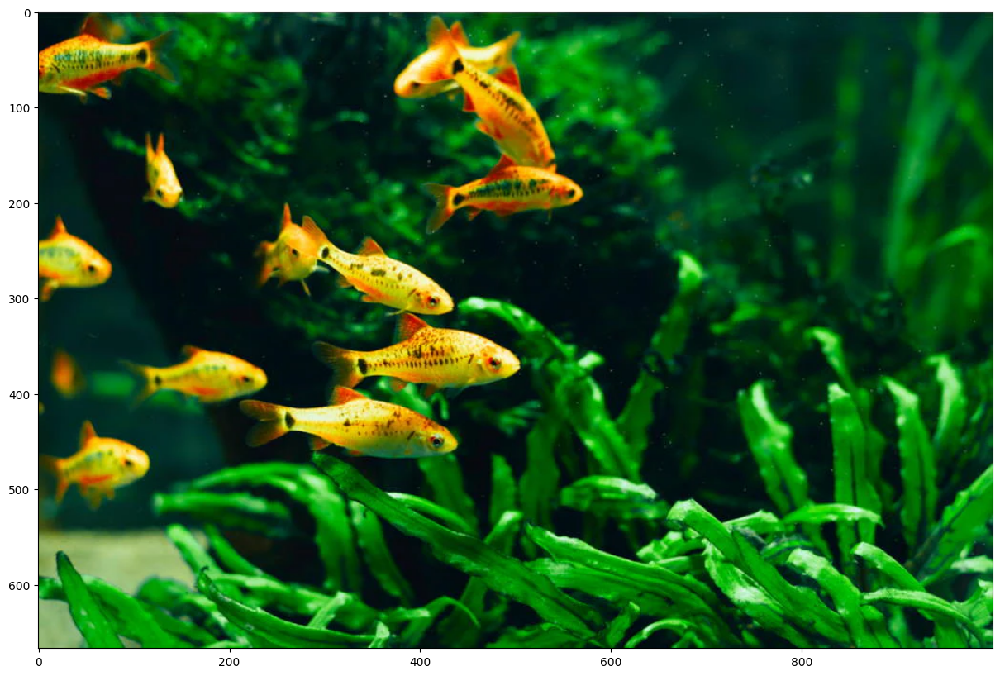


Label: bird
Box coordinates: 78, 353, 239, 417
Probability: 0.9079908728599548

Label: bird
Box coordinates: 3, 12, 137, 109
Probability: 0.8701769113540649

Label: banana
Box coordinates: 208, 394, 440, 471
Probability: 0.8610079288482666

Label: bird
Box coordinates: 241, 210, 435, 322
Probability: 0.8269436359405518

Label: bird
Box coordinates: 408, 141, 574, 227
Probability: 0.7502672672271729

Label: bird
Box coordinates: 0, 213, 81, 309
Probability: 0.7092357873916626

Label: bird
Box coordinates: 384, 22, 572, 208
Probability: 0.5921085476875305

Label: bird
Box coordinates: 284, 318, 514, 416
Probability: 0.5297181606292725

Label: banana
Box coordinates: 260, 217, 436, 320
Probability: 0.49042534828186035

Label: bird
Box coordinates: 196, 391, 452, 483
Probability: 0.47314029932022095

Label: kite
Box coordinates: 406, 147, 576, 225
Probability: 0.3030346632003784

Label: kite
Box coordinates: 0, 214, 81, 303
Probability: 0.28903764486312866

Label: bird
Box coordinates: 24

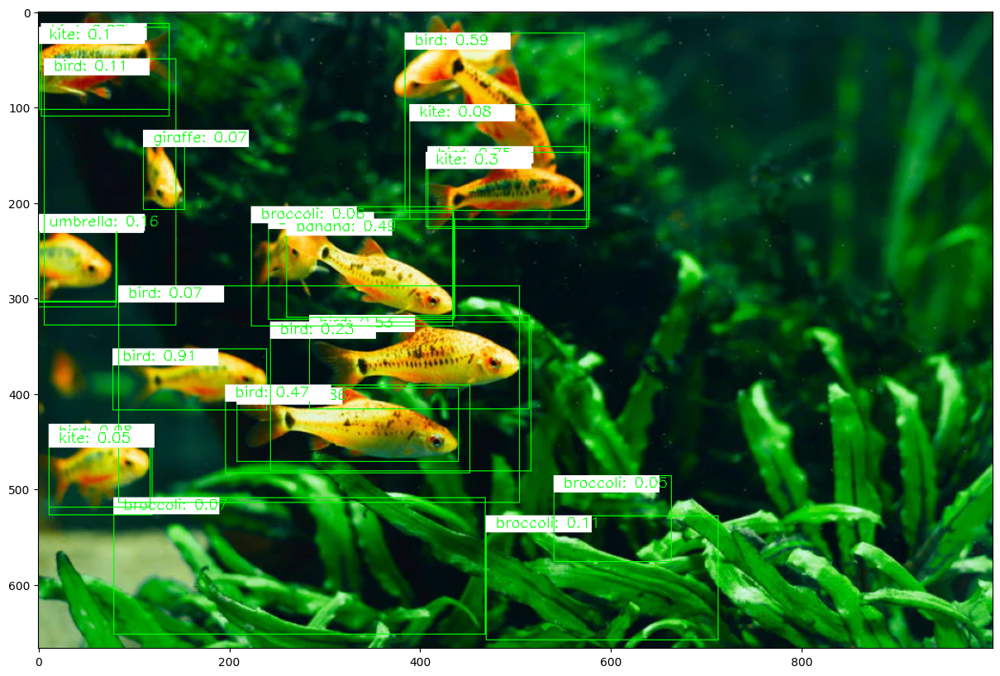

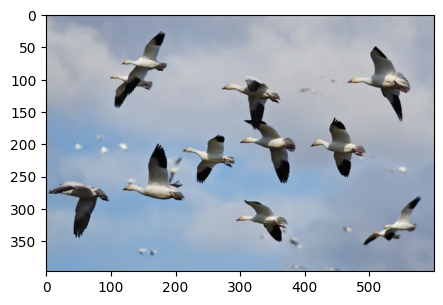


Label: bird
Box coordinates: 117, 198, 215, 288
Probability: 0.9981355667114258

Label: bird
Box coordinates: 492, 283, 580, 356
Probability: 0.9976676106452942

Label: bird
Box coordinates: 290, 286, 371, 352
Probability: 0.9932563304901123

Label: bird
Box coordinates: 8, 259, 100, 348
Probability: 0.9930825233459473

Label: bird
Box coordinates: 271, 97, 364, 177
Probability: 0.99072265625

Label: bird
Box coordinates: 210, 185, 290, 261
Probability: 0.988719642162323

Label: bird
Box coordinates: 410, 158, 489, 252
Probability: 0.9851186275482178


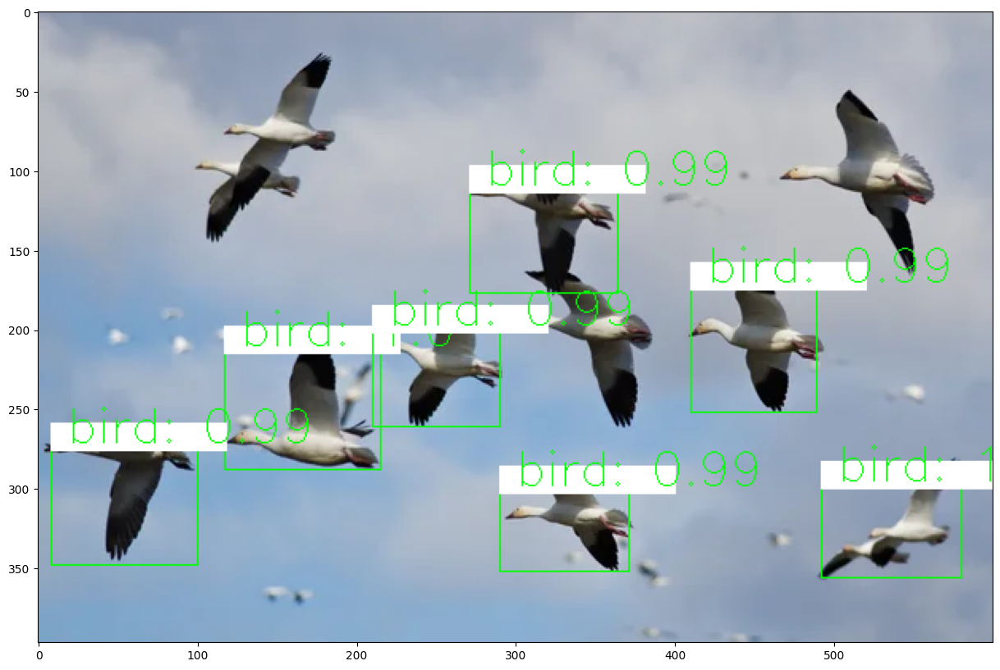

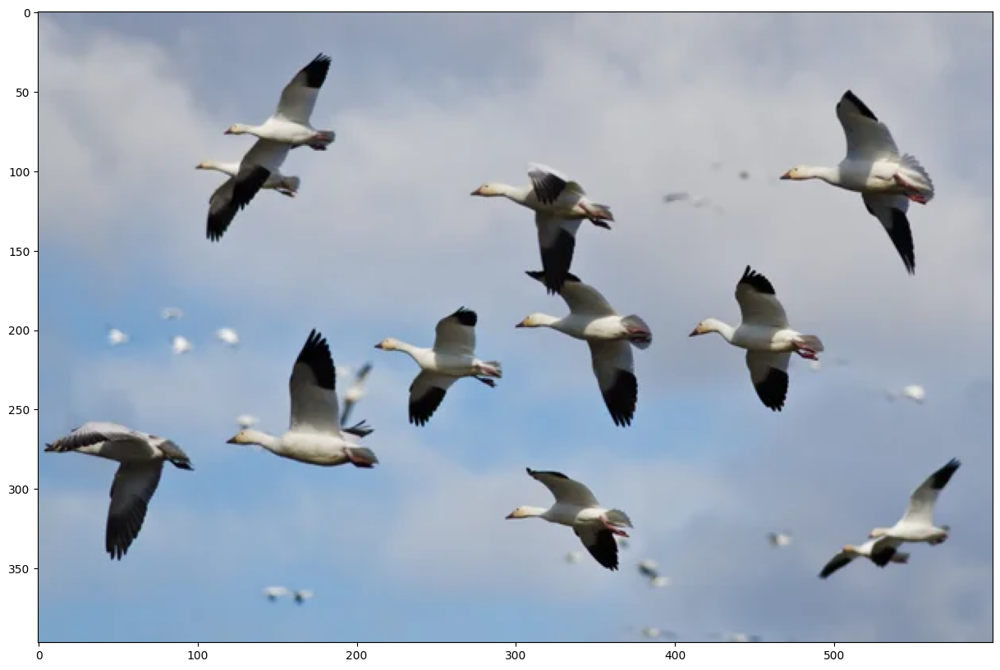

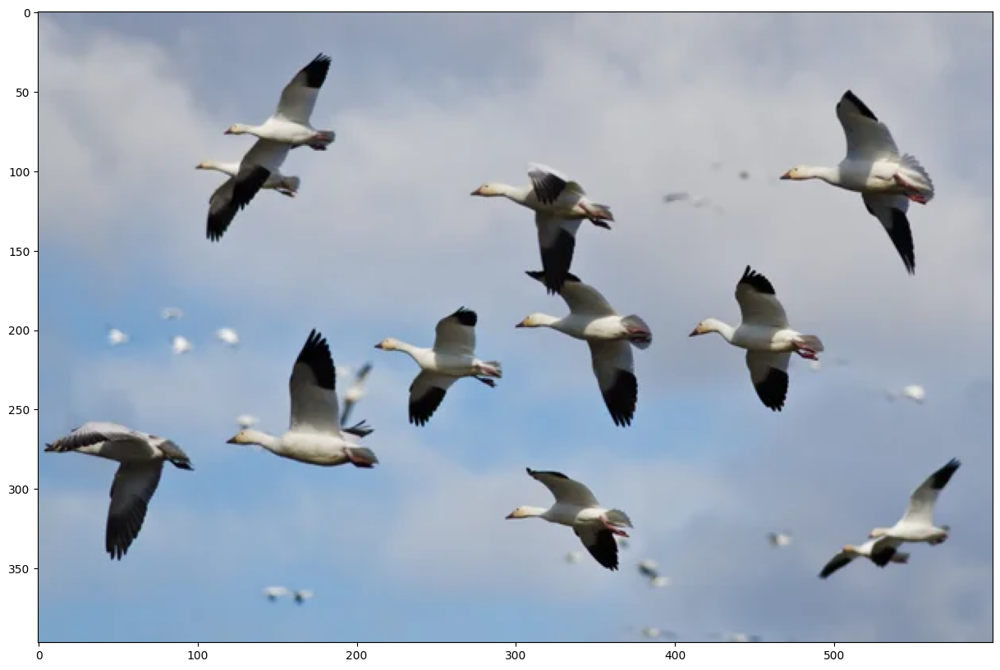

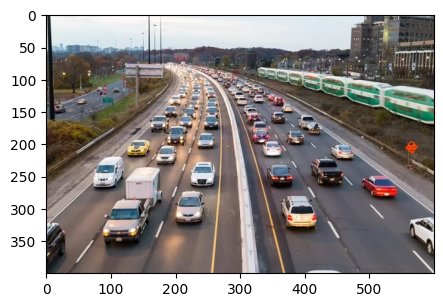


Label: car
Box coordinates: 223, 230, 262, 266
Probability: 0.9975475668907166


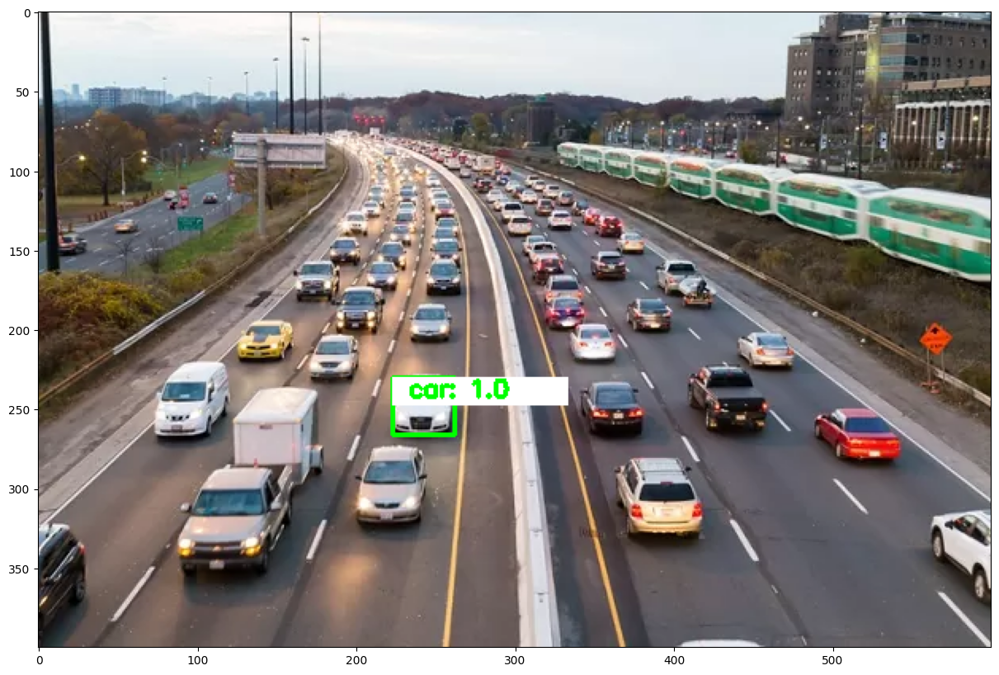

Changes have been made to the project on 2024-09-17 15:50:15


In [9]:
import torchvision
from torchvision import  transforms 
import torch
from torch import no_grad

"""Importing <code>request</code> library for getting data from the web

"""

import requests

"""libraries  for image processing and visualization

"""

import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

"""This function will assign a string name to a predicted class and eliminate predictions whose likelihood  is under a threshold.

"""

def get_predictions(pred, threshold=0.8, objects=None):
    """
    This function will assign a string name to a predicted class and eliminate predictions whose likelihood  is under a threshold 
    
    pred: a list where each element contains a tuple that corresponds to information about  the different objects; Each element includes a tuple with the class yhat, probability of belonging to that class and the coordinates of the bounding box corresponding to the object 
    image : frozen surface
    predicted_classes: a list where each element contains a tuple that corresponds to information about  the different objects; Each element includes a tuple with the class name, probability of belonging to that class and the coordinates of the bounding box corresponding to the object 
    thre
    """


    predicted_classes= [(COCO_INSTANCE_CATEGORY_NAMES[i],p,[(box[0], box[1]), (box[2], box[3])]) for i,p,box in zip(list(pred[0]['labels'].numpy()),pred[0]['scores'].detach().numpy(),list(pred[0]['boxes'].detach().numpy()))]
    predicted_classes=[  stuff  for stuff in predicted_classes  if stuff[1]>threshold ]
    
    if objects  and predicted_classes :
        predicted_classes=[ (name, p, box) for name, p, box in predicted_classes if name in  objects ]
    return predicted_classes

"""Draws box around each object

"""

def draw_box(pred_class, img, rect_th=2, text_size=0.5, text_th=2, download_image=False, img_name="img"):
    """
    draws box around each object 
    
    predicted_classes: a list where each element contains a tuple that corresponds to information about the different objects; Each element includes a tuple with the class name, probability of belonging to that class and the coordinates of the bounding box corresponding to the object 
    image : frozen surface 
   
    """
    image = (np.clip(cv2.cvtColor(np.clip(img.numpy().transpose((1, 2, 0)), 0, 1), cv2.COLOR_RGB2BGR), 0, 1) * 255).astype(np.uint8).copy()

    for predicted_class in pred_class:
      
      label=predicted_class[0]
      probability=predicted_class[1]
      box=predicted_class[2]
      t = round(box[0][0].tolist())
      l = round(box[0][1].tolist())
      r = round(box[1][0].tolist())
      b = round(box[1][1].tolist())

      # Giving brief information about rectange, class and probability.
      from colorama import Fore
      from colorama import Style
      print(f"\nLabel: {Fore.GREEN}{label}{Style.RESET_ALL}")
      print(f"Box coordinates: {t}, {l}, {r}, {b}")
      print(f"Probability: {probability}")

      # Drawing rectangle and adding text on the picture based on their class and size.
      cv2.rectangle(image, (t, l), (r, b), (0, 255, 0), rect_th)
      cv2.rectangle(image, (t, l), (t+110, l+17), (255, 255, 255), -1)
      cv2.putText(image, label, (t+10, l+12),  cv2.FONT_HERSHEY_SIMPLEX, 
                  text_size, (0,255,0), thickness=text_th)
      cv2.putText(image, label+": "+str(round(probability, 2)), 
                  (t+10, l+12),  cv2.FONT_HERSHEY_SIMPLEX, text_size, 
                  (0, 255, 0),thickness=text_th)

    # Plotting image
    image = np.array(image)
    plt.figure(figsize=(15, 10))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    if download_image:
      plt.savefig(f'{img_name}.png')
    else:
      pass
    plt.show()
    
    del(img)
    del(image)

"""This function  will speed up your code by freeing memory:

"""

def save_RAM(image_=False):
    global image, img, pred
    torch.cuda.empty_cache()
    del(img)
    del(pred)
    if image_:
        image.close()
        del(image)

"""<br>

<a id="load_faster_rcnn"></a>

<h2 align=center>Load Pre-trained Faster R-CNN</h2>

<a href='https://arxiv.org/abs/1506.01497?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDeveloperSkillsNetworkCV0101ENCoursera25797139-2021-01-01'>Faster R-CNN</a> is a model that predicts both bounding boxes and class scores for potential objects in the image  pre-trained on <a href="https://cocodataset.org/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDeveloperSkillsNetworkCV0101ENCoursera25797139-2021-01-01">COCO</a>. Faster R-CNN model with a ResNet-50-FPN backbone from <a href='https://arxiv.org/abs/1506.01497'>the Faster R-CNN: Towards Real-Time Object Detection with Region Proposal Networks paper.</a>

<br>
"""

model_ = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model_.eval()

for name, param in model_.named_parameters():
    param.requires_grad = False
print("done")

"""the function calls Faster R-CNN <code> model\_ </code> but save RAM:

"""

def model(x):
    with torch.no_grad():
        yhat = model_(x)
    return yhat

"""Here are the 91 classes.

"""

COCO_INSTANCE_CATEGORY_NAMES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]
len(COCO_INSTANCE_CATEGORY_NAMES)

"""<br>

<a id="object_localization"></a>

<h2 align=center>Object Localization</h2>

In Object Localization we locate the presence of objects in an image and indicate the location with a bounding box. Consider the image of <a href="https://www.linkedin.com/in/andrewyng">Andrew Ng</a>
"""

img_path=(r"C:\Users\amree\Downloads\India-National-Cricket-Team-players.webp")
half = 0.5
image = Image.open(img_path)

image.resize([int(half * s) for s in image.size] )
plt.figure(figsize=(5, 5))
plt.imshow(image)
plt.show()

"""<p>We will create a transform object to convert the image to a tensor.</p>

"""

transform = transforms.Compose([transforms.ToTensor()])

img = transform(image)

"""<p>Let's print out our image:</p>"""

img

"""<p>We can make a prediction,The output is a dictionary with several predicted classes, the probability of belonging to that class and the coordinates of the bounding box corresponding to that class.</p>

"""

pred = model([img])

"""<p><b>note</b>:  if you call <code>model\_(\[img])</code>  directly but it will use more RAM</p>

"""

len(pred[0]['labels'])

"""we have the 2  different class predictions, ordered by likelihood scores for potential objects.

"""

pred[0]['labels']

"""We have the likelihood of each class:

"""

pred[0]['scores']

"""<p>The class number corresponds to the index of the list with the corresponding  category name.</p>

"""

index=pred[0]['labels'][0].item()
COCO_INSTANCE_CATEGORY_NAMES[index]

"""<p>We have the coordinates of the bounding box.</p>

"""

bounding_box=pred[0]['boxes'][0].tolist()
bounding_box

"""<p>These components correspond to the top-left corner and bottom-right corner of the rectangle, more precisely: <b>top(t), left(l), bottom(b), right(r).</b></p>

<p>We need to round them, otherwise we can't show it on picure.</p>
"""

t, l, r, b = [round(x) for x in bounding_box]
print(t, l, r, b)

"""We convert the tensor to an OpenCV array and plot an image with the box:

"""

img_plot=(np.clip(cv2.cvtColor(np.clip(img.numpy().transpose((1, 2, 0)), 0, 1), cv2.COLOR_RGB2BGR), 0, 1) * 255).astype(np.uint8)
cv2.rectangle(img_plot, (t, l), (r, b), (0, 255, 0), 10) # Draw Rectangle with the coordinates
plt.figure(figsize=(15, 10))
plt.imshow(cv2.cvtColor(img_plot, cv2.COLOR_BGR2RGB))
plt.show()
del img_plot, t, l, r, b

"""We can localize objects; we do this using the function <code>get_predictions</code>. The input  is the predictions <code>pred</code> and the <code>objects</code> you would like to localize.

<b>Loss equasion:</b>

$$||box\ - \hat{box}||^2 = (y_{min} - \hat{y_{min}})^2 + (y_{max} - \hat{y_{max}})^2 + (x_{min} - \hat{x_{min}})^2 + (x_{max} - \hat{x_{max}})^2$$

<br>
"""

pred_class=get_predictions(pred, objects="person")
draw_box(pred_class, img)

del pred_class

"""We can set a threshold <code>threshold</code>. Here we set the  threshold 1 i.e Here we set the  threshold 1 i.e. 100% likelihood.

"""

get_predictions(pred, threshold=1, objects="person")

"""Here we have no output as the likelihood is not 100%.  Let's try a threshold of 0.98 and use the function  draw_box to draw the box and plot the class and it's rounded likelihood.

"""

pred_thresh=get_predictions(pred, threshold=0.98, objects="person")
draw_box(pred_thresh, img, download_image=True, img_name="andrew_BOX")
del pred_thresh

"""Delete objects to save memory, we will run this after every cell:

"""

save_RAM(image_=True)

"""We can locate multiple objects, consider the following <a href='https://www.kdnuggets.com/2015/03/talking-machine-deep-learning-gurus-p1.html?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDeveloperSkillsNetworkCV0101ENCoursera25797139-2021-01-01'>image</a>, we can detect the people in the image.

"""

img_path=(r"C:\Users\amree\Downloads\gold_barbs_in_planted_tank.webp")
image = Image.open(img_path)
image.resize([int(half * s) for s in image.size])
plt.figure(figsize=(5, 5))
plt.imshow(np.array(image))
plt.show()

"""we can set a threshold to detect the object, 0.9 seems to work.

"""

img = transform(image)
pred = model([img])
pred_thresh=get_predictions(pred, threshold=0.8)
draw_box(pred_thresh, img, rect_th=1, text_size= 0.5, text_th=1)

del pred_thresh

"""Or we can use objects parameter:

"""

pred_obj=get_predictions(pred,objects="person")
draw_box(pred_obj, img, rect_th=1,text_size= 0.5, text_th=1, download_image=True, img_name="dl_guys_IBM_BOX")

del pred_obj

"""If we set the threshold too low, we will detect objects that are not there.

"""

pred_thresh=get_predictions(pred,threshold=0.01)
draw_box(pred_thresh, img, rect_th= 1, text_size=0.5, text_th=1)

del pred_thresh

"""the following lines will speed up your code by using less RAM.

"""

save_RAM(image_=True)

"""<br>

<a id="object_detection"></a>

<h2 align=center>Object Detection</h2>

In Object Detection we find the classes as well detect the objects in an image. Consider the following <a href="https://www.dreamstime.com/stock-image-golden-retriever-puppy-lying-parakeet-perched-its-head-weeks-old-next-to-british-shorthair-kitten-sitting-image30336051?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDeveloperSkillsNetworkCV0101ENCoursera25797139-2021-01-01">image</a>
"""

img_path=(r"C:\Users\amree\Downloads\07C83C00-258E-4BE0-B702FD8EF0F26870_source.webp")
image = Image.open(img_path)
image.resize( [int(half * s) for s in image.size])
plt.figure(figsize=(5, 5))
plt.imshow(np.array(image))
plt.show()
del img_path

"""If we set a threshold, we can detect all objects whose likelihood is above that threshold.

"""

img = transform(image)
pred = model([img])
pred_thresh=get_predictions(pred,threshold=0.97)
draw_box(pred_thresh,img,rect_th=1, text_size=1, text_th=1, download_image=True, img_name="dog_cat_bird_BOX")

del pred_thresh

"""We can specify the objects we would like to classify, for example, cats and dogs:

"""

# img = transform(image)
# pred = model([img])
pred_obj=get_predictions(pred, objects=["dog","cat"])
draw_box(pred_obj, img,rect_th=1, text_size= 0.5, text_th=1)
del pred_obj

"""If we set the threshold too low, we may detect objects with a low likelihood of being correct; here, we set the threshold to 0.7, and we incorrectly  detect a cat

"""

# img = transform(image)
# pred = model([img])
pred_thresh=get_predictions(pred, threshold=0.70, objects=["dog", "cat"])
draw_box(pred_thresh, img, rect_th= 1, text_size=1, text_th=1)

del pred_thresh

save_RAM(image_=True)

"""We can detect other objects. Consider the following <a href='https://www.flickr.com/photos/watts_photos/27581126637?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDeveloperSkillsNetworkCV0101ENCoursera25797139-2021-01-01'>image</a>; We can detect cars and airplanes

"""

img_path=(r"C:\Users\amree\Downloads\Oct-2-car-mechanic.webp")
image = Image.open(img_path)
image.resize( [int(half * s) for s in image.size])
plt.figure(figsize=(5, 5))
plt.imshow(np.array(image))
plt.show()
del img_path

img = transform(image)
pred = model([img])
pred_thresh=get_predictions(pred, threshold=0.997)
draw_box(pred_thresh, img, download_image=True, img_name="car_plane_BOX")
del pred_thresh

save_RAM(image_=True)

"""<br>

<a id="test_model_uploaded"></a>

<h2 align=center>Test Model With an Uploaded Image</h2>

Replace with the name of your image as seen in your directory into <code>img_path</code> variable.
"""



from datetime import datetime
print(f"Changes have been made to the project on {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")